# Chapter 5: Selecting Characteristics in Generated Images



This chapter covers:
* Building a conditional GAN to generate images with certain attributes (human faces with or without eyeglasses, for example) 
* Implementing Wasserstein distance and gradient penalty to improve image quality
* Selecting random noise vectors so that the trained GAN model generates images with certain characteristics (male or female faces, for example)
* Combining conditional GAN with random noise vector selection to specify two independent attributes of the generated images (female faces without glasses or male faces with glasses, for example)

The Anime faces we generated with DCGAN in Chapter 4 look realistic. However, you may have noticed that each generated image has different attributes such as hair color, eye color, and whether the head tilts toward left or right... You may be wondering: is there a way to tweak the model so that the generated images have certain characteristics (such as with black hair and tilting toward the left)?

It turns out you can. 

In this chapter, you'll learn two different ways of selecting characteristics in the generated images. The first one is by hand-picking random noise vectors in the latent space: a different noise vector leads to a certain characteristic that you prefer. While one vector leads to a male face, another leads to a female face, for example. The second way is to implement a conditional GAN: you'll train the model on labeled data and ask the trained model to generate data with a specific label. Each label in the model corresponds to a certain characteristic. For example, one label tells the model to generate images of human faces with eyeglasses while another tells the model to create human faces without eyeglasses. When generating new images, we sample from the latent space and attach an image label to the latent variable. The generator then creates an image based on the attached image label: either with or without eyeglasses in it.

In addition, you’ll learn to combine the two methods so that you can select two independent attributes of the images at the same time. As a result, you can generate four different groups of images: males with glasses, males without glasses, females with glasses, and females without glasses. To make things more interesting, you can use a weighted average of the labels or a weighted average of the input random noise vectors to generate images that transition from one attribute to another. For example, you can generate a series of images so that the eyeglasses gradually fade out on the same person's face (label arithmetic). Or you can generate a series of images so that the male features gradually fade out and the face changes from a male face to a female face (vector arithmetic). 

Being able to conduct either vector arithmetic or label arithmetic alone feels like science fiction, let alone doing the two arithmetics simultaneously. The whole experience reminds us of the quote by Arthur C. Clarke (author of 2001: A Space Odyssey), “Technology advanced enough is indistinguishable from magic.” 

While the Anime faces we generated in Chapter 4 look realistic, the resolution is still low. Training GAN models can be challenging in many situations due to various reasons, such as a small sample size or poor sample image quality. As a result, models may never converge and the generated images may be of poor quality. Researchers have proposed ways to improve the training process by using different loss functions. In this chapter, we'll discuss the Wasserstein distance with the gradient penalty as a way to improve the training process for GANs. We'll then implement it in the training process in the conditional GAN so that the generated human faces are realistic. You'll also notice that the image quality from this chapter is better than that from the previous chapter as a result.

# 1. The Eye Glasses Dataset

## 1.1 Download the Dataset
The eyeglasses dataset we use is from Kaggle. Log into Kaggle and go to the link https://www.kaggle.com/datasets/jeffheaton/glasses-or-no-glasses/data to download the image folder and the two CSV files on the right: train.csv and test.csv. There are 5000 images in the folder /faces-spring-2020/. Once you have the data, place both the image folder and the two CSV files inside /Desktop/dgai/files/ on your computer.

In [3]:
# install pandas in a code cell !pip install pandas
## test github push


import pandas as pd

train=pd.read_csv('/kaggle/input/glasses-or-no-glasses/train.csv')
train.set_index('id', inplace=True)

In [4]:
train

,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,...,v504,v505,v506,v507,v508,v509,v510,v511,v512,glasses
id,,,,,,,,,,,,,,,,,,,,,
1,0.37797,-0.94808,0.01346,0.17893,0.37795,0.63571,0.13943,-0.25607,-0.39341,1.08947,...,-0.03494,1.32443,-0.94570,0.02055,-1.23908,0.43507,1.08635,1.69027,0.61609,0
2,0.07609,-0.09774,0.39666,-0.39026,0.10606,0.52774,0.07105,0.33720,0.69917,-0.02842,...,0.86624,-1.24953,-0.21511,-1.54146,1.04765,-1.24035,0.00866,-1.27640,-0.60496,1
3,1.19391,-0.68707,-0.68422,-0.36378,-0.60847,-0.40118,1.45432,0.00592,1.68940,-0.98205,...,-0.35893,0.02330,0.31548,-0.34923,-0.41772,-0.58175,-0.60177,0.43555,0.41982,1
4,1.34949,-0.31498,-1.30248,0.50278,1.66292,-1.06094,-0.70835,-0.24237,-0.15509,-0.04532,...,0.23942,0.20774,0.81792,-0.74814,-0.62521,0.01689,0.83997,-0.46986,0.06755,0
5,-0.03512,-0.34196,0.14230,1.50513,-0.14364,0.49429,0.07823,-0.04356,0.42009,-0.88828,...,-1.78407,0.07465,1.50182,-0.41289,-0.55908,-0.29702,0.83641,0.59756,-0.20298,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4496,0.54554,0.63002,1.99328,-0.73290,-0.28964,0.61707,0.69515,0.87060,0.18784,-0.53365,...,-0.91652,0.24407,1.02312,-1.06633,0.06479,0.80146,0.57461,1.69958,0.43941,0
4497,-0.26235,0.50776,-0.74164,-0.52717,-0.35846,-1.16202,0.21828,0.22305,-0.78329,0.09361,...,0.86871,-0.09672,-0.32991,-0.69076,-0.40691,-0.56606,-0.33767,-0.01251,0.06872,0
4498,-0.81564,-0.46034,-0.40044,0.21816,0.75283,-0.58075,-0.38389,0.26561,-0.80443,0.49042,...,-0.22298,0.14621,-0.45917,0.69664,0.08561,-0.42261,0.14222,0.10394,-0.33635,1


In [5]:
print(train["glasses"])

id
1       0
2       1
3       1
4       0
5       0
       ..
4496    0
4497    0
4498    1
4499    1
4500    0
Name: glasses, Length: 4500, dtype: int64


In [6]:
import os, shutil

G='files/glasses/G/'
NoG='files/glasses/NoG/'
os.makedirs(G, exist_ok=True)    #A
os.makedirs(NoG, exist_ok=True)    #B
folder='/kaggle/input/glasses-or-no-glasses/faces-spring-2020/faces-spring-2020/'
for i in range(1,4501):
    oldpath=f"{folder}face-{i}.png"
    if train.loc[i]['glasses']==0:    #C
        newpath=f"{NoG}face-{i}.png"
    elif train.loc[i]['glasses']==1:    #D
        newpath=f"{G}face-{i}.png"
    shutil.copy(oldpath, newpath)

## 1.2 Visualize images in the eyeglasses dataset

## important: make sure you do this:
The classification column *glasses* in the file *train.csv* is not perfect. If you go to the subfolder G on your computer, for example, you'll see that most images have glasses, but about 10% of them have no glasses. Similarly, if you go to the subfolder NoG, you'll see that about 10% of them actually have glasses. You need to manually correct this by moving images from one folder to the other. This is important for our training later so you should do the same: manually move images in the two folders so that one contains only images with glasses and the other images without glasses. Welcome to the life of a data scientist: fixing data problems is part of daily routine!

['face-654.png', 'face-867.png', 'face-372.png', 'face-214.png', 'face-2853.png', 'face-3032.png', 'face-2544.png', 'face-1029.png', 'face-1782.png', 'face-2424.png', 'face-3768.png', 'face-2166.png', 'face-3448.png', 'face-3367.png', 'face-4368.png', 'face-46.png']


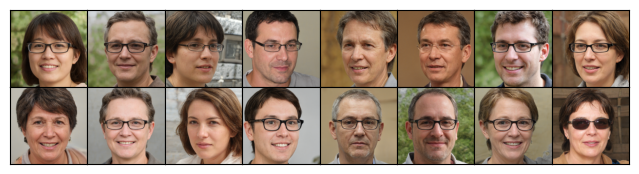

In [7]:
import random
import matplotlib.pyplot as plt
from PIL import Image

imgs=os.listdir(G)
random.seed(42)
samples=random.sample(imgs,16)
print(samples)
fig=plt.figure(dpi=100, figsize=(8,2))
for i in range(16):
    ax = plt.subplot(2, 8, i + 1)
    img=Image.open(f"{G}{samples[i]}")
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.01,hspace=-0.01)
plt.show()   

['face-3349.png', 'face-1226.png', 'face-4360.png', 'face-3102.png', 'face-195.png', 'face-3877.png', 'face-426.png', 'face-1969.png', 'face-2982.png', 'face-4326.png', 'face-2485.png', 'face-3073.png', 'face-339.png', 'face-1944.png', 'face-91.png', 'face-412.png']


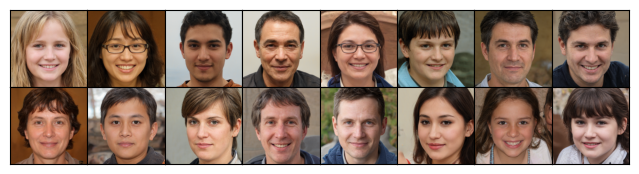

In [8]:
random.seed(42)
imgs=os.listdir(NoG)
samples=random.sample(imgs,16)
print(samples)
fig=plt.figure(dpi=100, figsize=(8,2))
for i in range(16):
    ax = plt.subplot(2, 8, i + 1)
    img=Image.open(f"{NoG}{samples[i]}")
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.01,hspace=-0.01)
plt.show()  

# 2. Conditional GAN wtih Wasserstein Distance


# 3. Create a conditional GAN
## 3.1. A Critic in Conditional GAN


In [9]:
import torch.nn as nn
import torch

# determine the device automatically
device = "cuda" if torch.cuda.is_available() else "cpu"
class Critic(nn.Module):
    def __init__(self, img_channels, features):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(img_channels, features, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self.block(features, features * 2, 4, 2, 1),
            self.block(features * 2, features * 4, 4, 2, 1),
            self.block(features * 4, features * 8, 4, 2, 1),
            self.block(features * 8, features * 16, 4, 2, 1),  
            self.block(features * 16, features * 32, 4, 2, 1),            
            nn.Conv2d(features * 32, 1, kernel_size=4,stride=2, padding=0))
    def block(self, in_channels, out_channels, kernel_size, stride,padding):
        return nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size,stride,padding,bias=False,),
            nn.InstanceNorm2d(out_channels, affine=True),
            nn.LeakyReLU(0.2))
    def forward(self, x):
        return self.net(x)

## 3.2. The Generator in Conditional GAN


In [10]:
class Generator(nn.Module):
    def __init__(self, noise_channels, img_channels, features):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self.block(noise_channels, features *64, 4, 1, 0),
            self.block(features * 64, features * 32, 4, 2, 1),
            self.block(features * 32, features * 16, 4, 2, 1),
            self.block(features * 16, features * 8, 4, 2, 1),
            self.block(features * 8, features * 4, 4, 2, 1),            
            self.block(features * 4, features * 2, 4, 2, 1),            
            nn.ConvTranspose2d(features * 2, img_channels, kernel_size=4,stride=2, padding=1),
            nn.Tanh())
    def block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride,padding,bias=False,),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),)
    def forward(self, x):
        return self.net(x)

## 3.3 Weight initialization and the gradient penalty function

In [12]:
def weights_init(m):
    classname = m.__class__.__name__
    print(classname)
    if classname.find('Conv') != -1:
        print(m.weight.data.shape)
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        print(m.weight.data.shape)
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)    

In [13]:
z_dim=100
img_channels=3
features=16
gen=Generator(z_dim+2,img_channels,features).to(device)
critic=Critic(img_channels+2,features).to(device)
weights_init(gen)
weights_init(critic)


Generator
Critic


In [14]:
gen.apply(weights_init)

ConvTranspose2d
torch.Size([102, 1024, 4, 4])
BatchNorm2d
torch.Size([1024])
ReLU
Sequential
ConvTranspose2d
torch.Size([1024, 512, 4, 4])
BatchNorm2d
torch.Size([512])
ReLU
Sequential
ConvTranspose2d
torch.Size([512, 256, 4, 4])
BatchNorm2d
torch.Size([256])
ReLU
Sequential
ConvTranspose2d
torch.Size([256, 128, 4, 4])
BatchNorm2d
torch.Size([128])
ReLU
Sequential
ConvTranspose2d
torch.Size([128, 64, 4, 4])
BatchNorm2d
torch.Size([64])
ReLU
Sequential
ConvTranspose2d
torch.Size([64, 32, 4, 4])
BatchNorm2d
torch.Size([32])
ReLU
Sequential
ConvTranspose2d
torch.Size([32, 3, 4, 4])
Tanh
Sequential
Generator


Generator(
  (net): Sequential(
    (0): Sequential(
      (0): ConvTranspose2d(102, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (4): Sequential(
      (0): C

In [15]:
lr = 0.0001
opt_gen = torch.optim.Adam(gen.parameters(), lr = lr, betas=(0.0, 0.9))
opt_critic = torch.optim.Adam(critic.parameters(), lr = lr, betas=(0.0, 0.9))

In [16]:
def GP(critic, real, fake):
    B, C, H, W = real.shape
    alpha=torch.rand((B,1,1,1)).repeat(1,C,H,W).to(device)
    interpolated_images = real*alpha+fake*(1-alpha)
    critic_scores = critic(interpolated_images)
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=critic_scores,
        grad_outputs=torch.ones_like(critic_scores),
        create_graph=True,
        retain_graph=True)[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gp = torch.mean((gradient_norm - 1) ** 2)
    return gp

# 4. Train the conditional GAN


## 4.1. Adding labels


In [17]:
import torchvision.transforms as T
import torchvision

batch_size=16
imgsz=256
transform=T.Compose([
    T.Resize((imgsz,imgsz)),
    T.ToTensor(),
    T.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])])      
data_set=torchvision.datasets.ImageFolder(root=r"files/glasses",transform=transform) 

In [18]:
data_set

Dataset ImageFolder
    Number of datapoints: 4500
    Root location: files/glasses
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
           )

In [19]:
data_set[0][0].shape,data_set[0][1]

(torch.Size([3, 256, 256]), 0)

In [20]:
onehot=torch.zeros((2))
onehot

tensor([0., 0.])

In [21]:
channels=torch.zeros((2,imgsz,imgsz))
channels.shape

torch.Size([2, 256, 256])

In [22]:
newdata=[]
for i,(img,label) in enumerate(data_set):
    onehot=torch.zeros((2))
    onehot[label]=1
    channels=torch.zeros((2,imgsz,imgsz))
    if label==0:
        channels[0,:,:]=1
    else:
        channels[1,:,:]=1    
    img_and_label=torch.cat([img,channels],dim=0)    
    newdata.append((img,label,onehot,img_and_label))

In [23]:
len(newdata)

4500

In [24]:
newdata[0][0].shape,newdata[0][1],newdata[0][2].shape,newdata[0][3].shape

(torch.Size([3, 256, 256]), 0, torch.Size([2]), torch.Size([5, 256, 256]))

In [26]:
data_loader=torch.utils.data.DataLoader(newdata,batch_size=batch_size,shuffle=True)

In [27]:
data_bach = next(iter(data_loader))
data_bach[0].shape,data_bach[1].shape,data_bach[2].shape,data_bach[3].shape

(torch.Size([16, 3, 256, 256]),
 torch.Size([16]),
 torch.Size([16, 2]),
 torch.Size([16, 5, 256, 256]))

## 4.2	Train the Conditional GAN


In [28]:
z_dim

100

In [29]:
labels = torch.zeros(1, 2, 1, 1)
labels,labels.shape

(tensor([[[[0.]],
 
          [[0.]]]]),
 torch.Size([1, 2, 1, 1]))

In [30]:
def plot_epoch(epoch):
    # test images with glasses
    noise = torch.randn(32, z_dim, 1, 1)
    labels = torch.zeros(32, 2, 1, 1)
    # use label [1,0] so G knows what to generate
    labels[:,0,:,:]=1
    noise_and_labels=torch.cat([noise,labels],dim=1).to(device)
    fake=gen(noise_and_labels).cpu().detach()
    fig=plt.figure(figsize=(20,10),dpi=100)
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.subplots_adjust(hspace=-0.6)
    plt.savefig(f"files/glasses/G{epoch}.png")
    plt.show() 
    # test images without glasses
    noise = torch.randn(32, z_dim, 1, 1)
    labels = torch.zeros(32, 2, 1, 1)
    # use label [0,1] so G knows what to generate
    labels[:,1,:,:]=1
    noise_and_labels=torch.cat([noise,labels],dim=1).to(device)
    fake=gen(noise_and_labels).cpu().detach()
    fig=plt.figure(figsize=(20,10),dpi=100)
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.subplots_adjust(hspace=-0.6)
    plt.savefig(f"files/glasses/NoG{epoch}.png")
    plt.show()     

In [33]:
def train_batch(onehots,img_and_labels,epoch):
    real = img_and_labels.to(device)
    B = real.shape[0]
    # train critic five times
    for _ in range(2):
        noise = torch.randn(B, z_dim, 1, 1)
        onehots=onehots.reshape(B,2,1,1)
        noise_and_labels=torch.cat([noise,onehots],dim=1).to(device)
        fake_img = gen(noise_and_labels).to(device)
        fakelabels=img_and_labels[:,3:,:,:].to(device)
        fake=torch.cat([fake_img,fakelabels],dim=1).to(device)
        critic_real = critic(real).reshape(-1)
        critic_fake = critic(fake).reshape(-1)
        gp = GP(critic, real, fake)
        loss_critic=(-(torch.mean(critic_real) - torch.mean(critic_fake)) + 10 * gp)
        opt_critic.zero_grad()
        loss_critic.backward(retain_graph=True)
        opt_critic.step()
    # train G
    gen_fake = critic(fake).reshape(-1)
    loss_gen = -torch.mean(gen_fake)
    opt_gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()
    return loss_critic, loss_gen

at epoch 1, critic loss: -26.44645118713379, generator loss 27.258697509765625


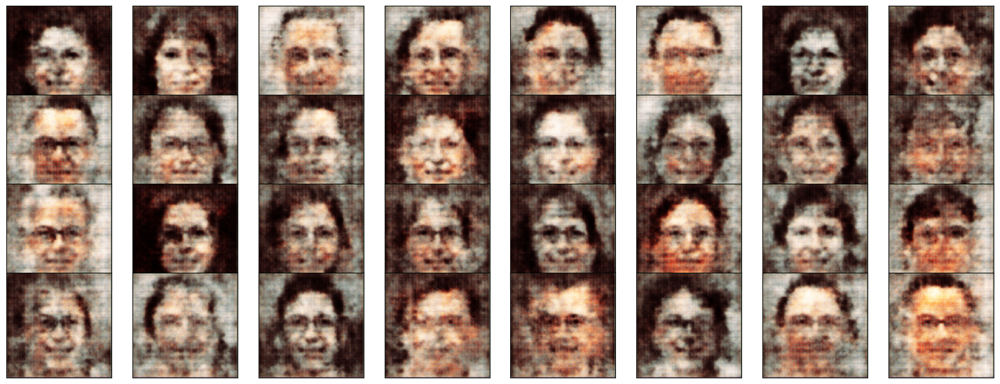

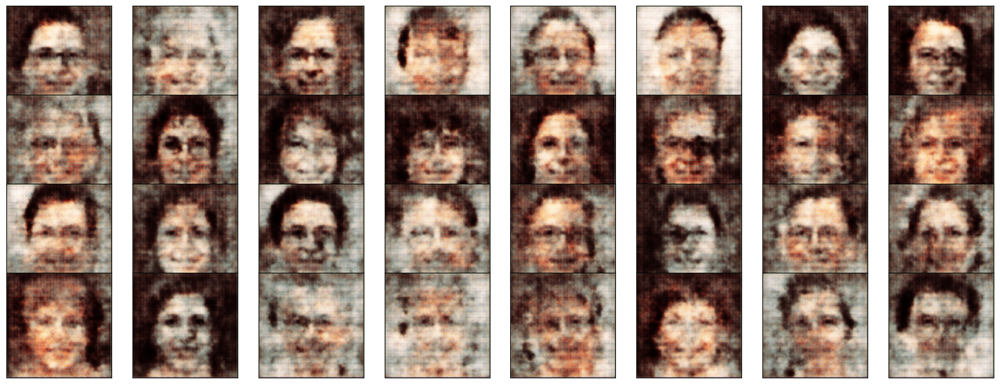

In [34]:
for epoch in range(1,2):
    closs=0
    gloss=0
    for _,_,onehots,img_and_labels in data_loader:    
        # train a batch
        loss_critic, loss_gen = train_batch(onehots,img_and_labels,epoch)   
        closs+=loss_critic.detach()/len(data_loader)
        gloss+=loss_gen.detach()/len(data_loader)
    print(f"at epoch {epoch}, critic loss: {closs}, generator loss {gloss}")
    plot_epoch(epoch)
torch.save(gen.state_dict(),'files/cgan.pth')

# 5. Select characteristics in generated images


## 5.1. Select images with or without eyeglasses


<ipython-input-35-8998292e35ec>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load("files/cgan.pth",map_location=device))


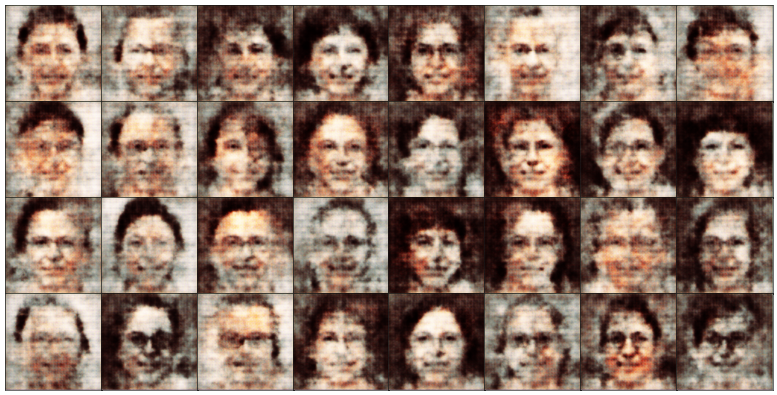

In [35]:
torch.manual_seed(0)

generator=Generator(z_dim+2,img_channels,features).to(device)
generator.load_state_dict(torch.load("files/cgan.pth",map_location=device))
generator.eval()

noise_g = torch.randn(32, z_dim, 1, 1)
labels_g = torch.zeros(32, 2, 1, 1)
labels_g[:,0,:,:]=1
noise_and_labels=torch.cat([noise_g,labels_g],dim=1).to(device)
fake=generator(noise_and_labels)
plt.figure(figsize=(20,10),dpi=50)
for i in range(32):
    ax = plt.subplot(4, 8, i + 1)
    img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
    plt.imshow(img.numpy())
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show() 

In [36]:
z_male_g=noise_g[0]
z_female_g=noise_g[14]

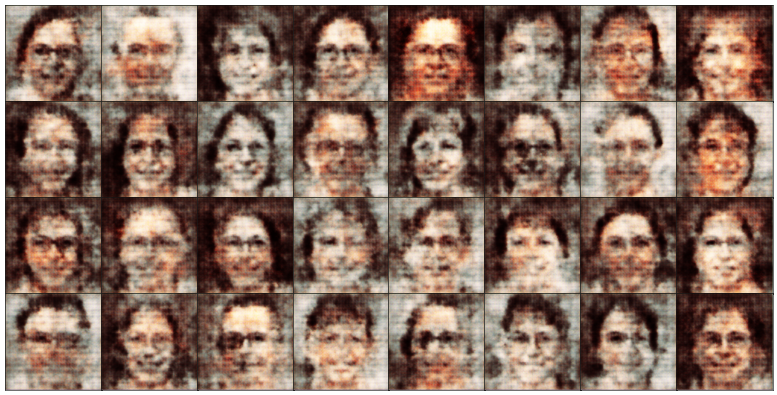

In [37]:
noise_ng = torch.randn(32, z_dim, 1, 1)
labels_ng = torch.zeros(32, 2, 1, 1)
labels_ng[:,1,:,:]=1
noise_and_labels=torch.cat([noise_ng,labels_ng],dim=1).to(device)
fake=generator(noise_and_labels).cpu().detach()
plt.figure(figsize=(20,10),dpi=50)
for i in range(32):
    ax = plt.subplot(4, 8, i + 1)
    img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
    plt.imshow(img.numpy())#.repeat(4,axis=0).repeat(4,axis=1))
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

In [38]:
z_male_ng=noise_ng[8]
z_female_ng=noise_ng[31]

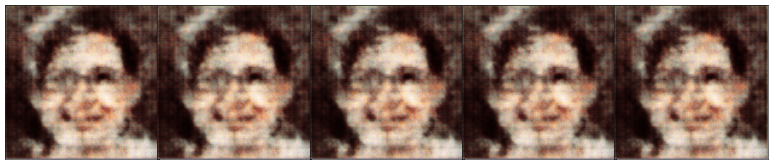

In [39]:
weights=[0,0.25,0.5,0.75,1]
plt.figure(figsize=(20,4),dpi=50)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    # change the value of z
    label=weights[i]*labels_ng[0]+(1-weights[i])*labels_g[0]
    noise_and_labels=torch.cat(
        [z_female_g.reshape(1, z_dim, 1, 1),
         label.reshape(1, 2, 1, 1)],dim=1).to(device)    
    fake=generator(noise_and_labels).cpu().detach()    
    img=(fake[0]/2+0.5).permute(1,2,0)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

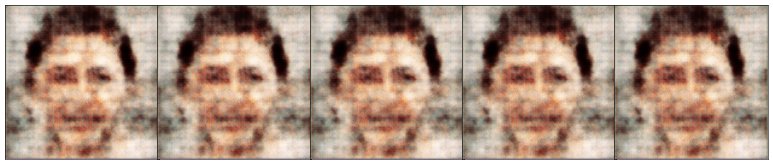

In [41]:
# solution to Exercise 5.1
weights=[0,0.25,0.5,0.75,1]
plt.figure(figsize=(20,4),dpi=50)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    # change the value of z
    label=weights[i]*labels_ng[0]+(1-weights[i])*labels_g[0]
    noise_and_labels=torch.cat([z_male_g.reshape(1, z_dim, 1, 1),label.reshape(1, 2, 1, 1)],dim=1).to(device)    
    fake=generator(noise_and_labels).cpu().detach()    
    img=(fake[0]/2+0.5).permute(1,2,0)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

## 5.2 Vector arithmetic in latent space  

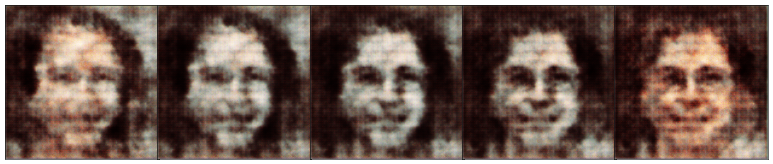

In [43]:
weights=[0,0.25,0.5,0.75,1]
plt.figure(figsize=(20,4),dpi=50)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    # change the value of z
    z=weights[i]*z_female_ng+(1-weights[i])*z_male_ng
    noise_and_labels=torch.cat([z.reshape(1, z_dim, 1, 1),labels_ng[0].reshape(1, 2, 1, 1)],dim=1).to(device)    
    fake=generator(noise_and_labels).cpu().detach()    
    img=(fake[0]/2+0.5).permute(1,2,0)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

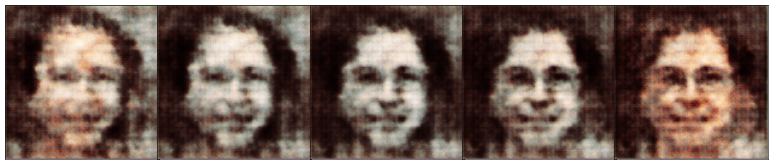

In [44]:
# solution to Exercise 5.2
weights=[0,0.25,0.5,0.75,1]
plt.figure(figsize=(20,4),dpi=50)
for i in range(5):
    ax = plt.subplot(1, 5, i + 1)
    # change the value of z
    z=weights[i]*z_female_ng+(1-weights[i])*z_male_ng
    noise_and_labels=torch.cat([z.reshape(1, z_dim, 1, 1),labels_g[0].reshape(1, 2, 1, 1)],dim=1).to(device)    
    fake=generator(noise_and_labels).cpu().detach()    
    img=(fake[0]/2+0.5).permute(1,2,0)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

## Select two characteristic simultaneously

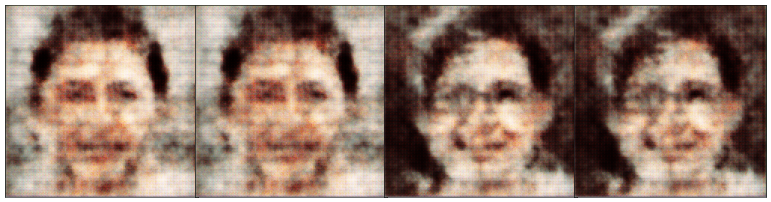

In [46]:
plt.figure(figsize=(20,5),dpi=50)
for i in range(4):
    ax = plt.subplot(1, 4, i + 1)
    p=i//2
    q=i%2 
    z=z_female_g*p+z_male_g*(1-p)
    label=labels_ng[0]*q+labels_g[0]*(1-q)
    noise_and_labels=torch.cat([z.reshape(1, z_dim, 1, 1),label.reshape(1, 2, 1, 1)],dim=1).to(device)
    fake=generator(noise_and_labels)
    img=(fake.cpu().detach()[0]/2+0.5).permute(1,2,0)
    plt.imshow(img.numpy())
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

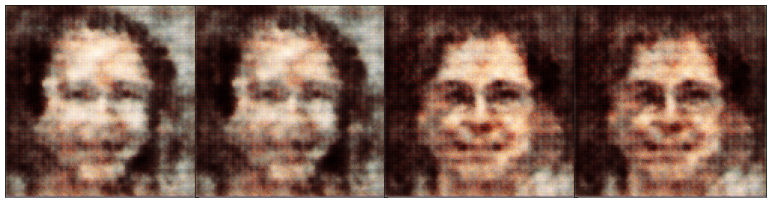

In [48]:
# solution to Exercise 5.3
plt.figure(figsize=(20,5),dpi=50)
for i in range(4):
    ax = plt.subplot(1, 4, i + 1)
    p=i//2
    q=i%2 
    z=z_female_ng*p+z_male_ng*(1-p)
    label=labels_ng[0]*q+labels_g[0]*(1-q)
    noise_and_labels=torch.cat([z.reshape(1, z_dim, 1, 1),label.reshape(1, 2, 1, 1)],dim=1).to(device)
    fake=generator(noise_and_labels)
    img=(fake.cpu().detach()[0]/2+0.5).permute(1,2,0)
    plt.imshow(img.numpy())
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

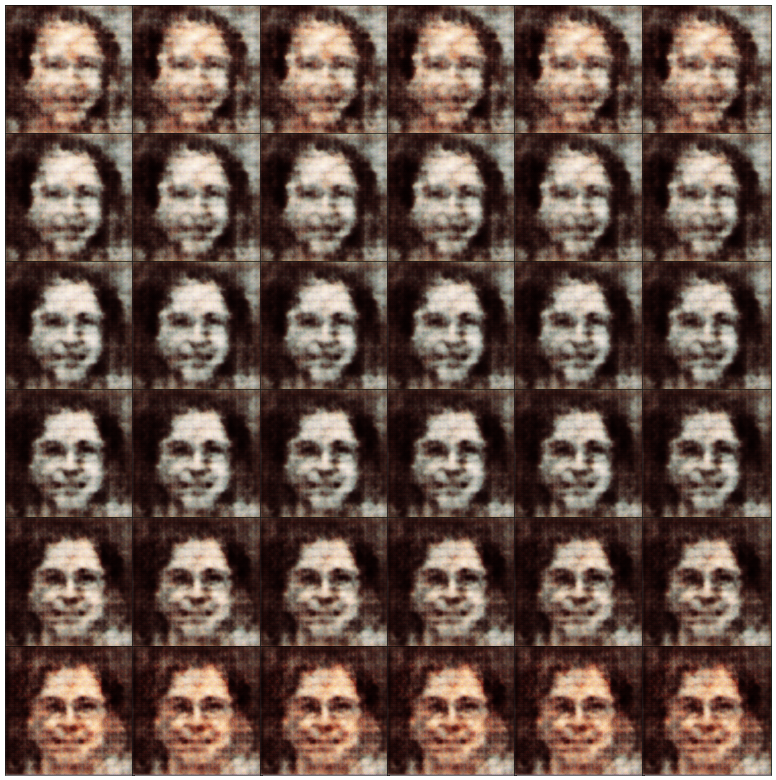

In [50]:
plt.figure(figsize=(20,20),dpi=50)
for i in range(36):
    ax = plt.subplot(6,6, i + 1)
    p=i//6
    q=i%6 
    z=z_female_ng*p/5+z_male_ng*(1-p/5)
    label=labels_ng[0]*q/5+labels_g[0]*(1-q/5)
    noise_and_labels=torch.cat([z.reshape(1, z_dim, 1, 1),label.reshape(1, 2, 1, 1)],dim=1).to(device)
    fake=generator(noise_and_labels)
    img=(fake.cpu().detach()[0]/2+0.5).permute(1,2,0)
    plt.imshow(img.numpy())
    plt.xticks([])
    plt.yticks([])
plt.subplots_adjust(wspace=-0.08,hspace=-0.01)
plt.show()

In [32]:
# solution to exercise 5.4
# note we changed z_dim+2 to z_dim+1
gen=Generator(z_dim+1,img_channels,features).to(device)
# note we changed img_channels+2 to img_channels+1
critic=Critic(img_channels+1,features).to(device)
weights_init(gen)
weights_init(critic)    
    
    
lr = 0.0001
opt_gen = torch.optim.Adam(gen.parameters(), lr = lr, betas=(0.0, 0.9))
opt_critic = torch.optim.Adam(critic.parameters(), lr = lr, betas=(0.0, 0.9))
# redefine the data iterator
newdata=[]
for i,(img,label) in enumerate(data_set):
    if label==0:
        # add just one channel; fill with 0s for glasses
        channels=torch.zeros((1,imgsz,imgsz))
    else:
        # add just one channel; fill with 1s for no glasses        
        channels=torch.ones((1,imgsz,imgsz))    
    img_and_label=torch.cat([img,channels],dim=0)    
    newdata.append((img,label,img_and_label))

data_loader=torch.utils.data.DataLoader(newdata,batch_size=batch_size,shuffle=True)

# label for g (with glasses); changed shape from (32,2,1,1) to (32,1,1,1)
labels_32g = torch.zeros(32, 1, 1, 1)
# label for ng (without glasses)
labels_32ng = torch.ones(32, 1, 1, 1)
def plot_epoch(epoch):
    # test images with glasses
    noise = torch.randn(32, z_dim, 1, 1)
    noise_and_labels=torch.cat([noise,labels_32g],dim=1).to(device)
    fake=gen(noise_and_labels).cpu().detach()
    fig=plt.figure(figsize=(20,10),dpi=100)
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.subplots_adjust(hspace=-0.6)
    plt.savefig(f"files/glasses/G{epoch}.png")
    plt.show() 
    # test images without glasses
    noise = torch.randn(32, z_dim, 1, 1)
    noise_and_labels=torch.cat([noise,labels_32ng],dim=1).to(device)
    fake=gen(noise_and_labels).cpu().detach()
    fig=plt.figure(figsize=(20,10),dpi=100)
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        img=(fake.cpu().detach()[i]/2+0.5).permute(1,2,0)
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
    plt.subplots_adjust(hspace=-0.6)
    plt.savefig(f"files/glasses/NoG{epoch}.png")
    plt.show()     
    
    
def train_batch(label,img_and_labels,epoch):
    real = img_and_labels.to(device)
    B = real.shape[0]
    # train critic five times
    for _ in range(5):
        noise = torch.randn(B,z_dim, 1, 1)
        label=label.reshape(B,1,1,1)
        noise_and_labels=torch.cat([noise,label],dim=1).to(device)
        fake_img = gen(noise_and_labels).to(device)
        fakelabels=img_and_labels[:,3:,:,:].to(device)
        fake=torch.cat([fake_img,fakelabels],dim=1).to(device)
        critic_real = critic(real).reshape(-1)
        critic_fake = critic(fake).reshape(-1)
        gp = GP(critic, real, fake)
        loss_critic=(-(torch.mean(critic_real) - torch.mean(critic_fake)) + 10 * gp)
        opt_critic.zero_grad()
        loss_critic.backward(retain_graph=True)
        opt_critic.step()
    # train G
    gen_fake = critic(fake).reshape(-1)
    loss_gen = -torch.mean(gen_fake)
    opt_gen.zero_grad()
    loss_gen.backward()
    opt_gen.step()
    return loss_critic, loss_gen    
    
for epoch in range(1,101):
    closs=0
    gloss=0
    for _,label,img_and_labels in data_loader:    
        # train a batch
        loss_critic, loss_gen = train_batch(label,img_and_labels,epoch)   
        closs+=loss_critic.detach()/len(data_loader)
        gloss+=loss_gen.detach()/len(data_loader)
    print(f"at epoch {epoch},\
    critic loss: {closs}, generator loss {gloss}")
    plot_epoch(epoch)
torch.save(gen.state_dict(),'files/cganbinary.pth')    

KeyboardInterrupt: 